In [1]:
import os

os.environ["PYISTP_CDFLIB"] = 'pycdfpp'
#os.environ["PYISTP_CDFLIB"]='spacepy'
import pyistp
import numpy as np
import requests
#%matplotlib qt
%matplotlib widget
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


def plot_spectrogram(istp, var_name):
    plt.figure()
    var = istp.data_variable(var_name)
    plt.semilogy()
    plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))

# MMS

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


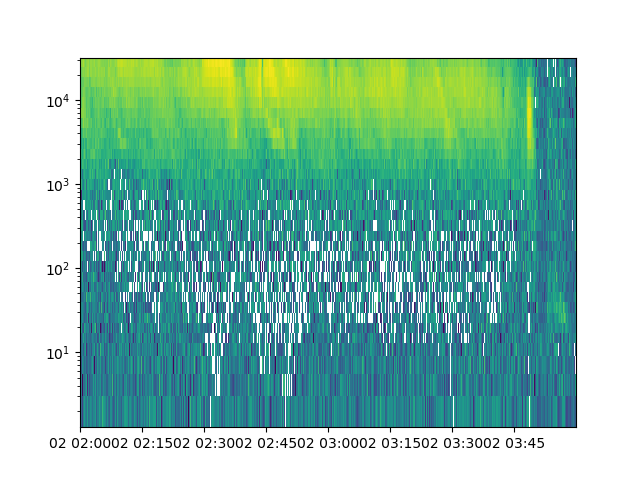

In [2]:
mms2_fpi_fast_l2_dis = pyistp.load(requests.get(
    "https://cdaweb.gsfc.nasa.gov/pub/data/mms/mms2/fpi/fast/l2/dis-moms/2020/09/mms2_fpi_fast_l2_dis-moms_20200902020000_v3.3.0.cdf").content)
plot_spectrogram(mms2_fpi_fast_l2_dis,'mms2_dis_energyspectr_mx_fast')

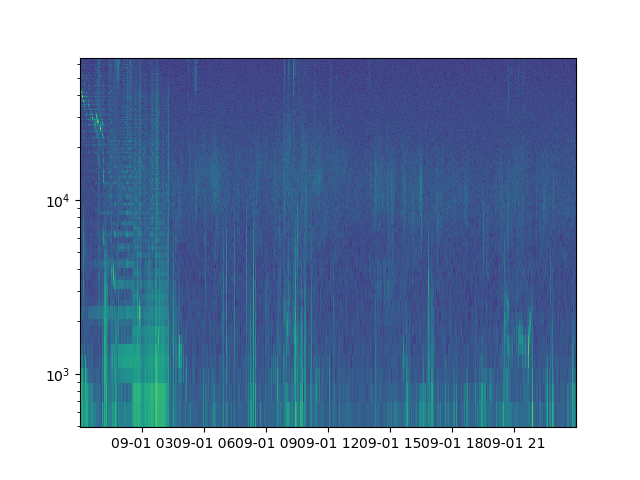

In [3]:
mms2_edp_srvy = pyistp.load(requests.get(
    "https://cdaweb.gsfc.nasa.gov/pub/data/mms/mms2/edp/srvy/l2/hfesp/2021/09/mms2_edp_srvy_l2_hfesp_20210901_v0.4.3.cdf").content)
plot_spectrogram(mms2_edp_srvy,'mms2_edp_hfesp_srvy_l2')

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


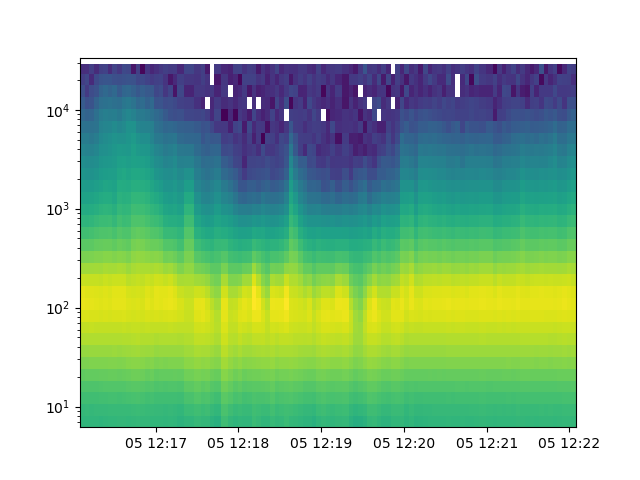

In [4]:
thd_l2_esa = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/themis/thd/l2/esa/2021/thd_l2_esa_20210105_v01.cdf").content)
plot_spectrogram(thd_l2_esa,'thd_peeb_en_eflux')

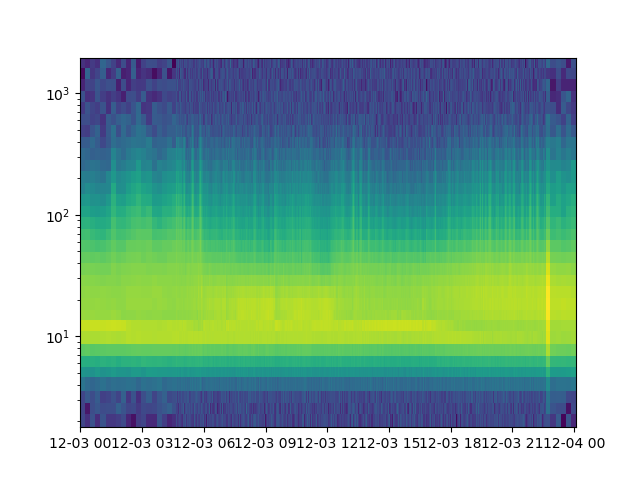

In [5]:
psp_swp_spe_sf0_l3 = pyistp.load(
    requests.get("https://spdf.gsfc.nasa.gov/pub/data/psp/sweap/spe/l3/spe_sf0_pad/2020/psp_swp_spe_sf0_l3_pad_20201203_v03.cdf").content)
plot_spectrogram(psp_swp_spe_sf0_l3,'EFLUX_VS_ENERGY')

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


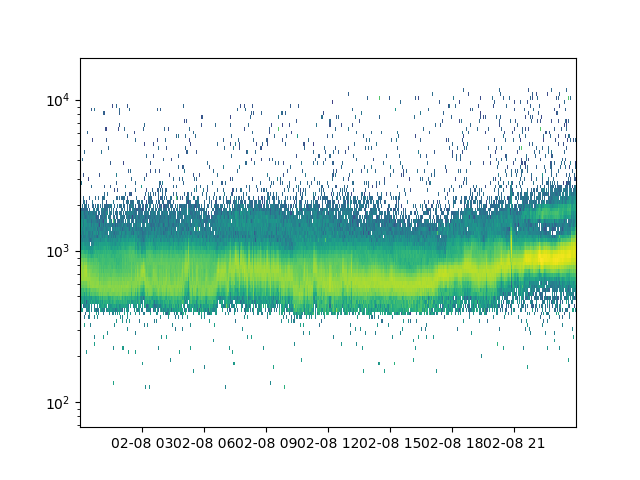

In [23]:
solo_l2_swa_pas_eflux = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/solar-orbiter/swa/science/l2/pas-eflux/2022/solo_l2_swa-pas-eflux_20220208_v02.cdf").content)
plot_spectrogram(solo_l2_swa_pas_eflux,'eflux')

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


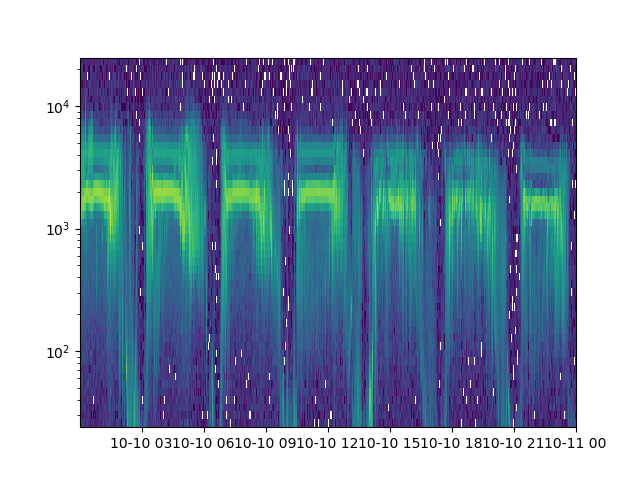

In [29]:
mvn_swi_l2_onboardsvyspec = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/maven/swia/l2/onboardsvyspec/2021/10/mvn_swi_l2_onboardsvyspec_20211010_v02_r00.cdf").content)
plot_spectrogram(mvn_swi_l2_onboardsvyspec, 'spectra_diff_en_fluxes')

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


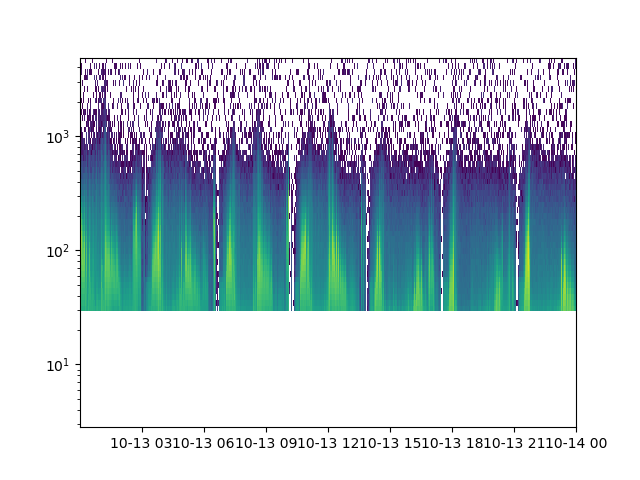

In [32]:
mvn_swe_l2_svyspec = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/maven/swea/l2/svyspec/2021/10/mvn_swe_l2_svyspec_20211013_v04_r03.cdf").content)
plot_spectrogram(mvn_swe_l2_svyspec, 'diff_en_fluxes')

/tmp/ipykernel_2607965/582243593.py:17: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(var.axes[0].values, var.axes[1].values.T, np.log10(var.values.T))


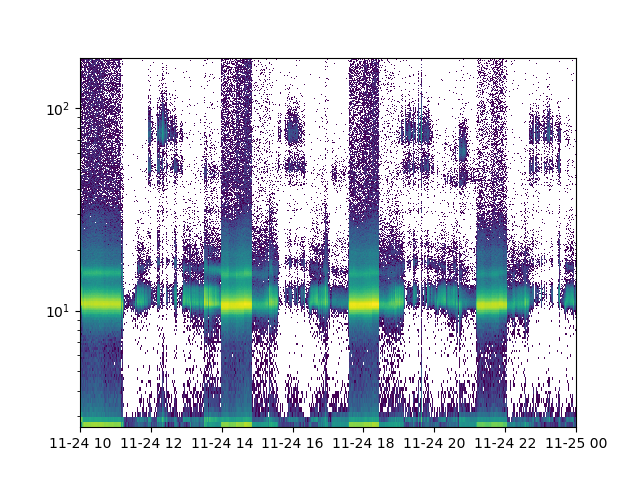

In [41]:
mvn_sta_l2_db = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/maven/static/l2/db-1024tof/2021/11/mvn_sta_l2_db-1024tof_20211124_v02_r06.cdf").content)
plot_spectrogram(mvn_sta_l2_db, 'data')

In [48]:
im_k0_euv = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/image/euv/euv_k0/2005/im_k0_euv_20050113_v01.cdf").content)

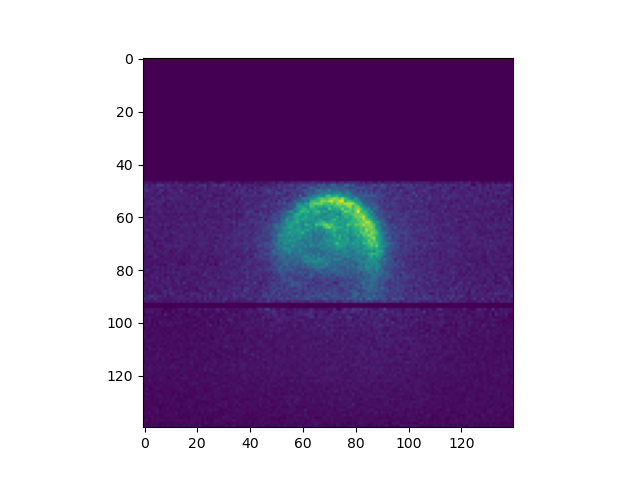

In [55]:
plt.figure()
plt.imshow(im_k0_euv.data_variable('IMAGE').values[0])

In [62]:
import matplotlib.animation as animation
from IPython.display import HTML
im_k0_wi = pyistp.load(
    requests.get("https://cdaweb.gsfc.nasa.gov/pub/data/image/fuv/wic_k0/2005/im_k0_wic_20050105_v01.cdf").content)

imageList = im_k0_wi.data_variable('WIC_PIXELS').values

def getImageFromList(x):
    return imageList[x]

fig = plt.figure(figsize=(6, 6))
ims = []
for i in range(len(imageList)):
    im = plt.imshow(getImageFromList(i), animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)
plt.close()

# Show the animation
HTML(ani.to_html5_video())